<h1> Lab01 – Basic Color And Gray Image Processing </h1>

In [1]:
"""
Họ và tên: Nguyễn Quang Trường
MSSV: 21110429 
Lớp: 21TTH_ Xử Lý Ảnh
Lab01: Basic Color And Gray Image Processing 
"""

'\nHọ và tên: Nguyễn Quang Trường\nMSSV: 21110429 \nLớp: 21TTH_ Xử Lý Ảnh\n\n'

# Bài 1

In [1]:
import numpy as np 
import pandas as pd
import cv2 
from matplotlib import pyplot as plt 
from pylab import imread
from skimage.color import rgb2gray

In [2]:
def imshows(ImageData, LabelData, rows, cols, gridType = False):
  # Convert ImageData and LabelData to List
  from matplotlib import pyplot as plt
  ImageArray = list(ImageData)
  LabelArray = list(LabelData)
  if(rows == 1 & cols == 1):
    fig = plt.figure(figsize=(20,20))
  else:
    fig = plt.figure(figsize=(cols*8,rows*5))
        
  for i in range(1, cols * rows + 1):
      fig.add_subplot(rows, cols, i)
      image = ImageArray[i - 1]
      # If the channel number is less than 3, we display as grayscale image
      # otherwise, we display as color image
      if (len(image.shape) < 3):
          plt.imshow(image, plt.cm.gray)
          plt.grid(gridType)
      else:
          plt.imshow(image)
          plt.grid(gridType)
      plt.title(LabelArray[i - 1])
  plt.show()

def ShowThreeImages(IM1, IM2, IM3):
    imshows([IM1, IM2, IM3], ["Image 1","Image 2", "Image 3"], 1, 3)
def ShowTwoImages(IM1, IM2):
    imshows([IM1, IM2], ["Image 1","Image 2"], 1, 2)
def ShowOneImage(IM):
    imshows([IM], ["Image"], 1, 1)
def ShowListImages(listImage, row, col):
    listCaption = []
    for i in range(len(listImage)):
        listCaption.append(str(i))
    imshows(listImage,listCaption,row,col)

## Đọc Ảnh

In [3]:
image_color= imread("Tau.jpg")

##  Tạo ảnh grayscale 

Dùng thủ công

In [4]:
Rchanel_scale=image_color[:,:,0]/255
Gchanel_scale=image_color[:,:,1]/255
Bchanel_scale=image_color[:,:,2]/255

Gchanel_scale=(Rchanel_scale+Gchanel_scale+Bchanel_scale)/3

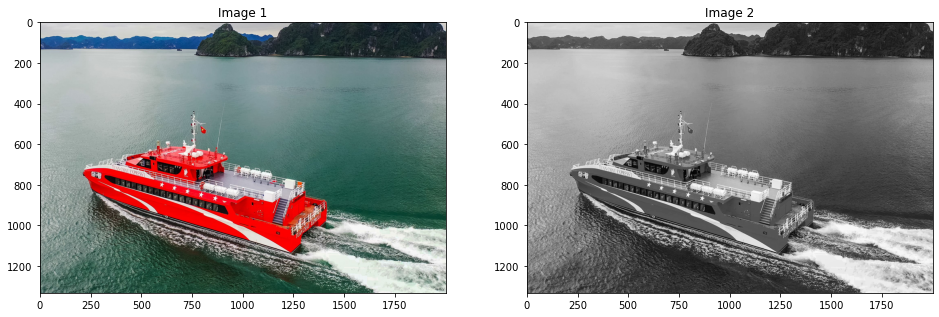

In [5]:
ShowTwoImages(image_color,Gchanel_scale)

## Tạo ảnh hsv và hiển thị các kênh hue, saturation và value

Tạo Ảnh HSV

In [6]:
img_hsv= cv2.cvtColor(image_color, cv2.COLOR_BGR2HSV)

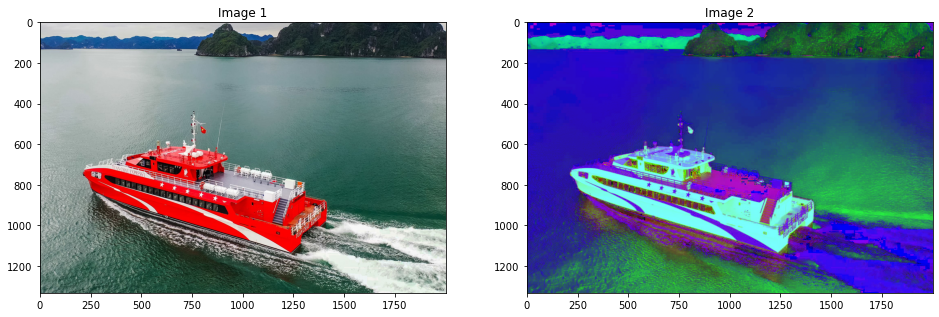

In [7]:
ShowTwoImages(image_color,img_hsv)

Tạo Kênh Hue, saturation và value

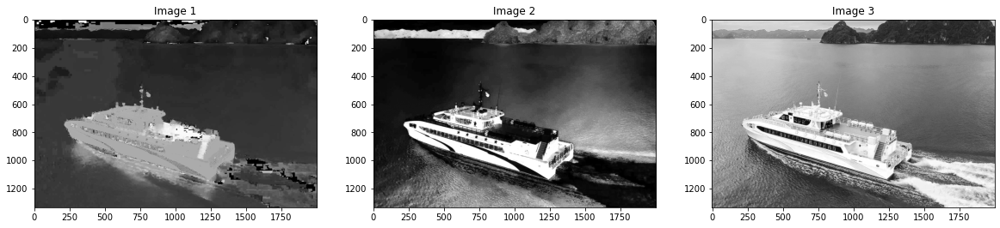

In [8]:
ShowThreeImages(img_hsv[:,:,0],img_hsv[:,:,1],img_hsv[:,:,2])

image 1: Kênh Hue
    
image 2: kênh Saturation
    
image 3: kênh value

## 	Chọn ngưỡng hue để trích xuất đối tượng chủ đạo trong ảnh 

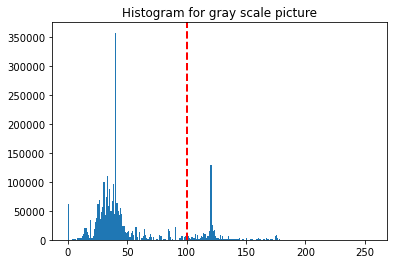

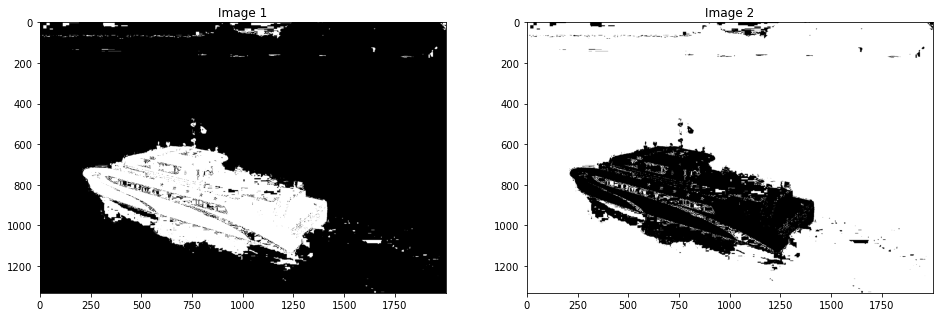

In [9]:
hue_img = img_hsv[:,:,0]
hue_threshold = 100

# Show Histogram of Hue Channel
hist = cv2.calcHist([hue_img],[0],None,[256],[0,256])
plt.hist(hue_img.ravel(),256,[0,256])
plt.axvline(x=hue_threshold, color='r', linestyle='dashed', linewidth=2)
plt.title('Histogram for gray scale picture')
plt.show()

# Use threshold to segment object by histogram
hue_binary01 = hue_img > hue_threshold
hue_binary02 = 1 - hue_binary01

ShowTwoImages(hue_binary01, hue_binary02)

Trích xuất đối tượng chủ đạo

In [10]:
def SegmentColorImageByMask(IM, Mask):    
    Mask = Mask.astype(np.uint8)
    result = cv2.bitwise_and(IM, IM, mask = Mask)
    return result

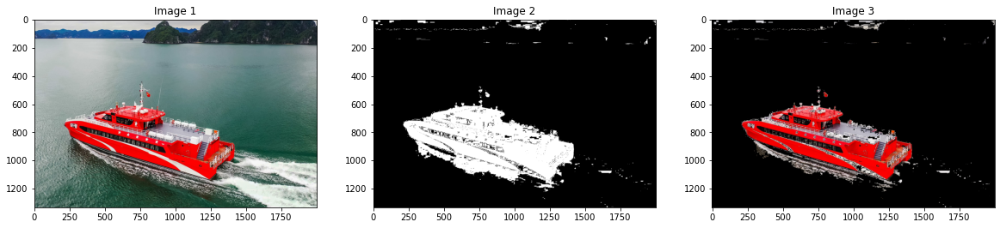

In [11]:
hue_binary01_rgb = SegmentColorImageByMask(image_color, hue_binary01)
ShowThreeImages(image_color, hue_binary01, hue_binary01_rgb)

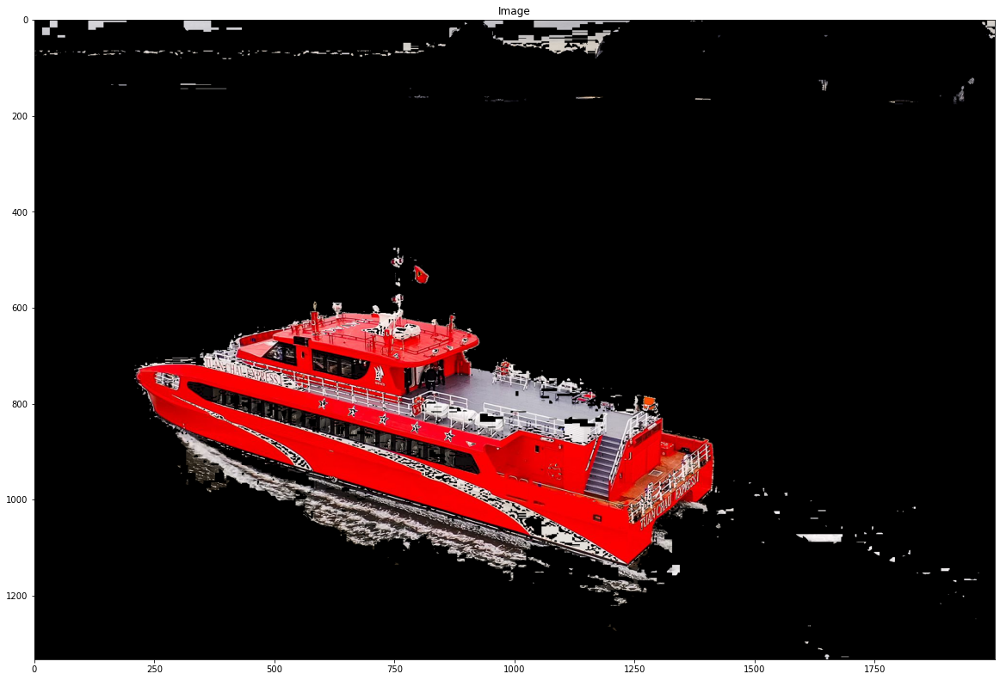

In [12]:
ShowOneImage(hue_binary01_rgb)

## Đổi màu ảnh sau khi trích Xuất Ảnh Chủ Đạo

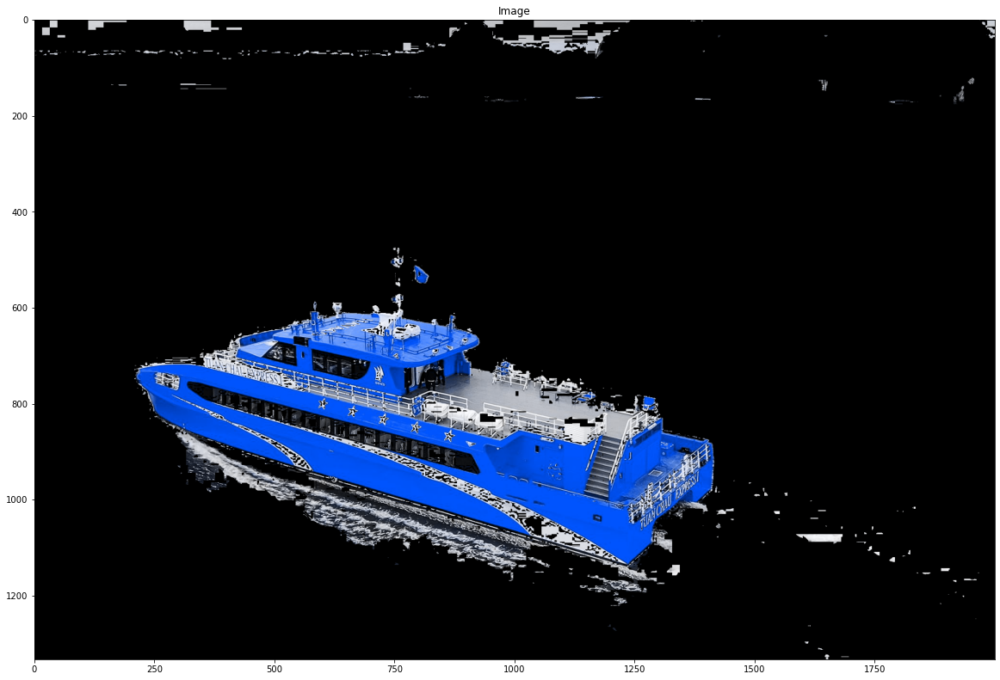

In [13]:

# Chuyển đổi ảnh sang không gian màu HSV
hsv_image = cv2.cvtColor(hue_binary01_rgb, cv2.COLOR_BGR2HSV)

# Định nghĩa màu mới cho Hue (H)
new_hue = 10

# Điều chỉnh màu Hue
hsv_image[:, :, 0] = new_hue

# Chuyển đổi lại sang không gian màu BGR
new_image = cv2.cvtColor(hsv_image, cv2.COLOR_HSV2BGR)
ShowOneImage(new_image)




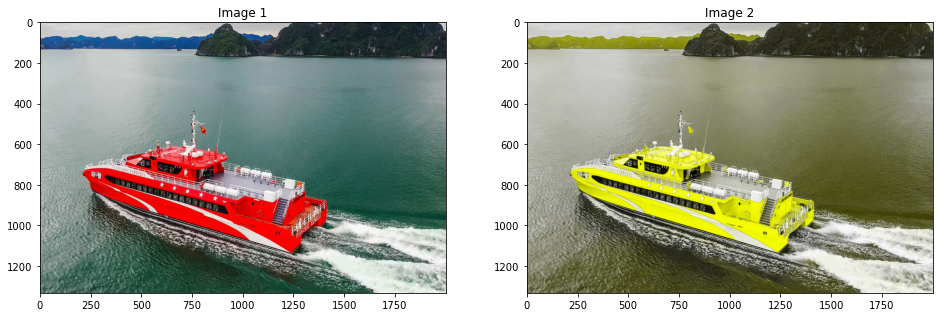

In [14]:
hsv_image = cv2.cvtColor(image_color, cv2.COLOR_BGR2HSV)
new_hue = 89
hsv_image[:, :, 0] = new_hue
new_image = cv2.cvtColor(hsv_image, cv2.COLOR_HSV2BGR)

ShowTwoImages(image_color,new_image)


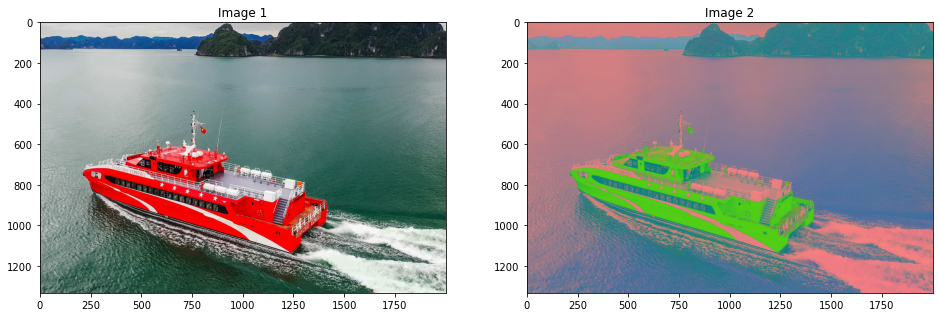

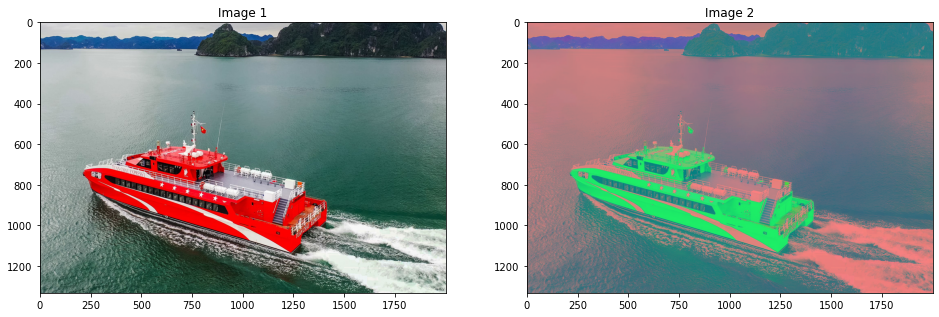

In [15]:
lab_image = cv2.cvtColor(image_color, cv2.COLOR_BGR2Lab)
ShowTwoImages(image_color,lab_image)

yuv_image = cv2.cvtColor(image_color, cv2.COLOR_BGR2YUV)
ShowTwoImages(image_color,yuv_image)

## Hiển thị histogram của 3 kênh màu h,s,v và r,g,b 

Histogram của 3 kênh màu r,g,b

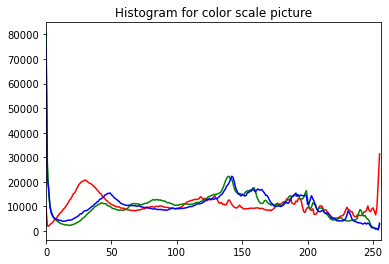

In [16]:
color = ('r', 'g', 'b')
for channel,col in enumerate(color):
    histr = cv2.calcHist([image_color],[channel],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([0,256])
plt.title('Histogram for color scale picture')
plt.show()

Histogram của 3 kênh màu h,s,v

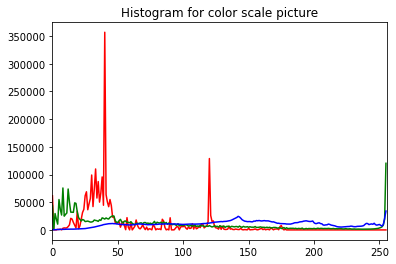

In [17]:
color = ('r', 'g', 'b')
for channel,col in enumerate(color):
    histr = cv2.calcHist([img_hsv],[channel],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([0,256])
plt.title('Histogram for color scale picture')
plt.show()

# Bài 2

##  Tạo ảnh xám từ ảnh màu

In [18]:
image2_color=imread("Hoasen.jpg")

In [19]:
image2_gray= cv2.cvtColor(image2_color,cv2.COLOR_RGB2GRAY)

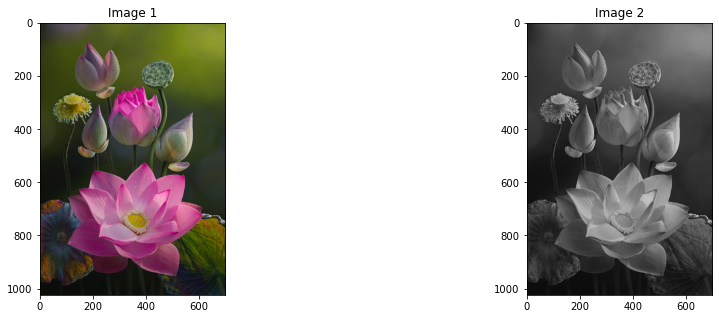

In [20]:
ShowTwoImages(image2_color,image2_gray)

## Làm mờ ảnh 

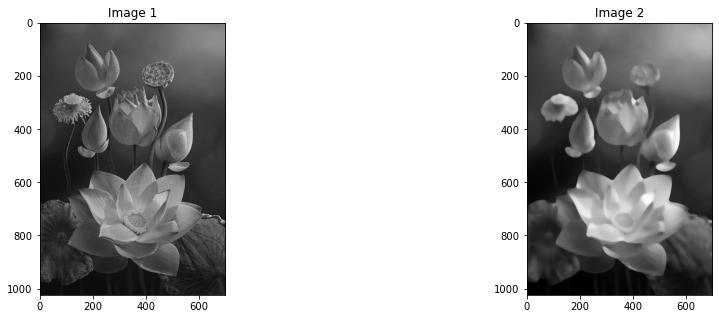

In [21]:
# Create Blurred Image
from skimage.filters.rank import median
from skimage.filters.rank import mean
from skimage.morphology import disk

image_blurred = median(image2_gray, disk(10))
ShowTwoImages(image2_gray, image_blurred)

## Làm nhiễu ảnh

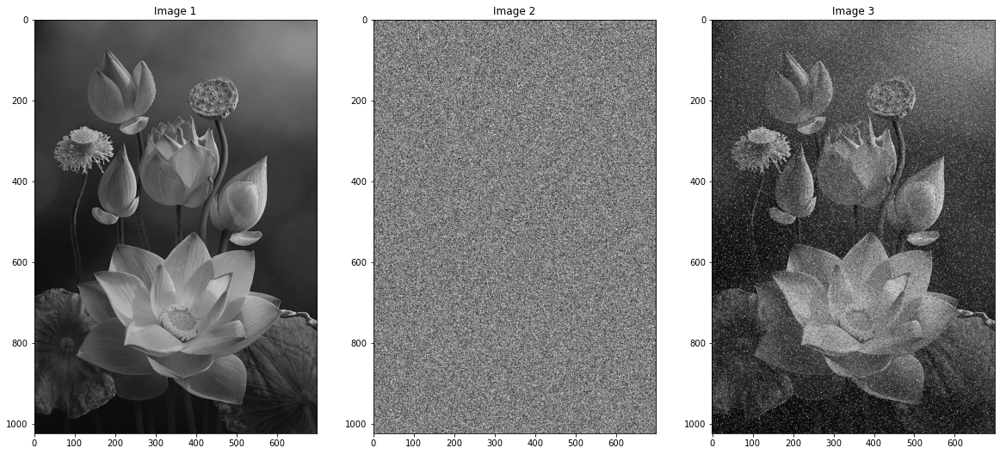

In [22]:
# Create Noise Image
noise = np.random.random(image2_gray.shape)
image_noise = image2_gray.copy()
image_noise[noise > 0.95] = 255
image_noise[noise < 0.05] = 0

ShowThreeImages(image2_gray, noise, image_noise)

## Khử Nhiễu Ảnh Bằng bộ lọc Median

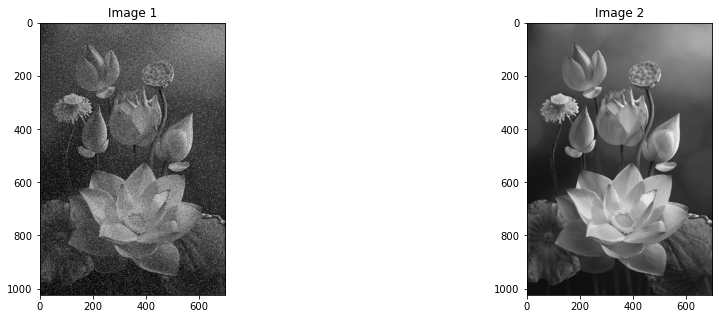

In [23]:

denoised_image = cv2.medianBlur(image_noise, 5)# kernel 5x5
ShowTwoImages(image_noise,denoised_image)

## Hiển thị histogram của ảnh xám và cân bằng histogram, hiển thị ảnh sau khi cân bằng

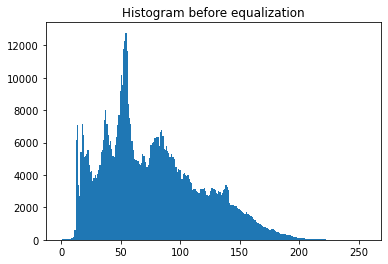

In [24]:
hist = cv2.calcHist([image2_gray],[0],None,[256],[0,256])
plt.hist(image2_gray.ravel(),256,[0,256])
plt.title('Histogram before equalization')
plt.show()

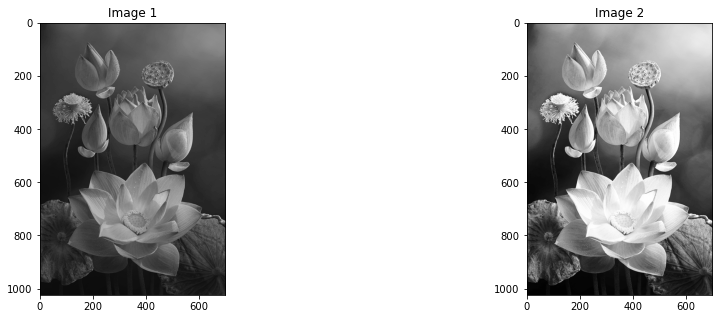

In [25]:
from skimage import data, exposure
image_equalization = exposure.equalize_hist(image2_gray)
image_equalization = np.float32(image_equalization * 255)
ShowTwoImages(image2_gray, image_equalization)

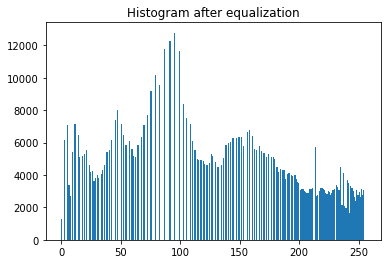

In [26]:
hist = cv2.calcHist([image_equalization],[0],None,[256],[0,256])
plt.hist(image_equalization.ravel(),256,[0,256])
plt.title('Histogram after equalization')
plt.show()

## Cân bằng 3 kênh màu hsv cùng lúc và hiển thị ảnh kết quả sau khi cân bằng

cân bằng histogram cho mỗi kênh màu (đỏ, xanh lá, xanh dương) của ảnh.

In [27]:
def histogram_equalize(img):
    r, g, b = cv2.split(img)
    red = cv2.equalizeHist(r)
    green = cv2.equalizeHist(g)
    blue = cv2.equalizeHist(b)
    return cv2.merge((red, green, blue))

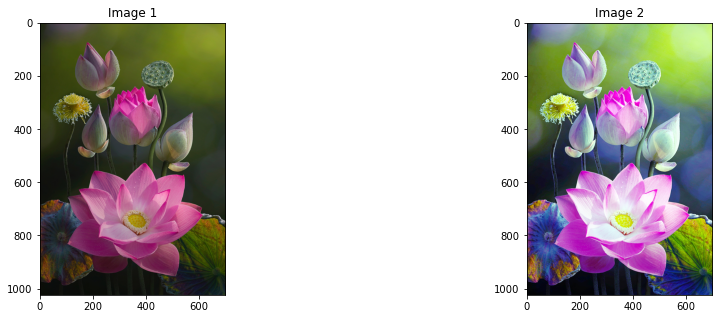

In [28]:
image_equalization_color = histogram_equalize(image2_color)
ShowTwoImages(image2_color, image_equalization_color)

____________________________

Cân bằng 3 kênh màu hsv

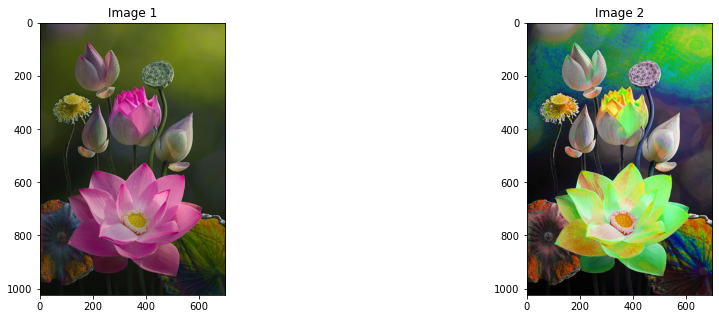

In [29]:
# Convert Image into HSV color spaces
image2_hsv = cv2.cvtColor(image2_color, cv2.COLOR_RGB2HSV)
# Apply histogram equalization
channel = 0
image2_hsv[:, :, channel] = cv2.equalizeHist(image2_hsv[:, :, channel])
channel = 1
image2_hsv[:, :, channel] = cv2.equalizeHist(image2_hsv[:, :, channel])
channel = 2
image2_hsv[:, :, channel] = cv2.equalizeHist(image2_hsv[:, :, channel])
# Convert to RGB
image2_enhanced = cv2.cvtColor(image2_hsv, cv2.COLOR_HSV2RGB)
ShowTwoImages(image2_color, image2_enhanced)

________________________________

Cân bằng kênh Saturation

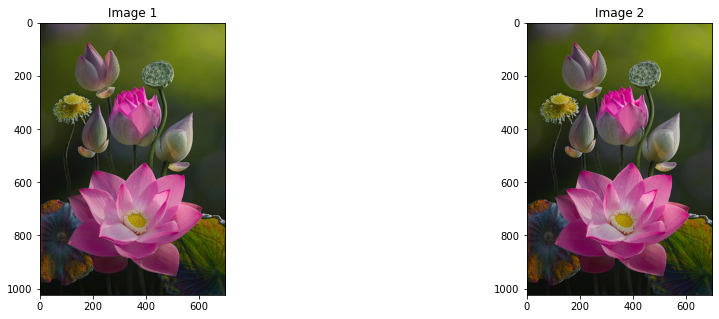

In [30]:
# Convert Image into HSV color spaces
image2_hsv = cv2.cvtColor(image2_color, cv2.COLOR_RGB2HSV)
# Apply histogram equalization
channel = 1
image2_hsv[:, :, channel] = cv2.equalizeHist(image2_hsv[:, :, channel])
# Convert to RGB
image2_enhanced = cv2.cvtColor(image2_hsv, cv2.COLOR_HSV2RGB)
ShowTwoImages(image2_color, image2_enhanced)

____________________________________

Cân bằng Kênh màu Value

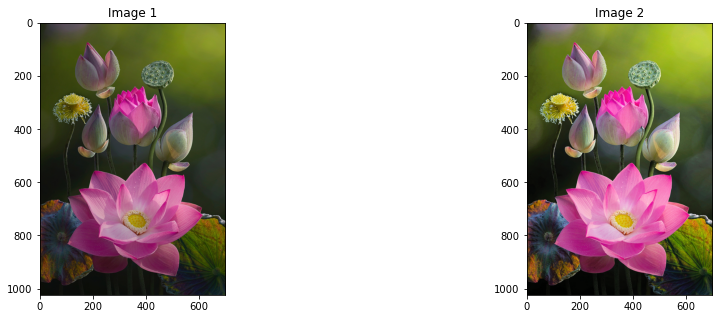

In [31]:
# Convert Image into HSV color spaces
image2_hsv = cv2.cvtColor(image2_color, cv2.COLOR_RGB2HSV)
# Apply histogram equalization
channel = 2
image2_hsv[:, :, channel] = cv2.equalizeHist(image2_hsv[:, :, channel])
# Convert to RGB
image2_enhanced = cv2.cvtColor(image2_hsv, cv2.COLOR_HSV2RGB)
ShowTwoImages(image2_color, image2_enhanced)

## Thực hiện các biến đổi gamma và hiển thị ảnh màu tương ứng

Biến đổi gamma trên kênh H

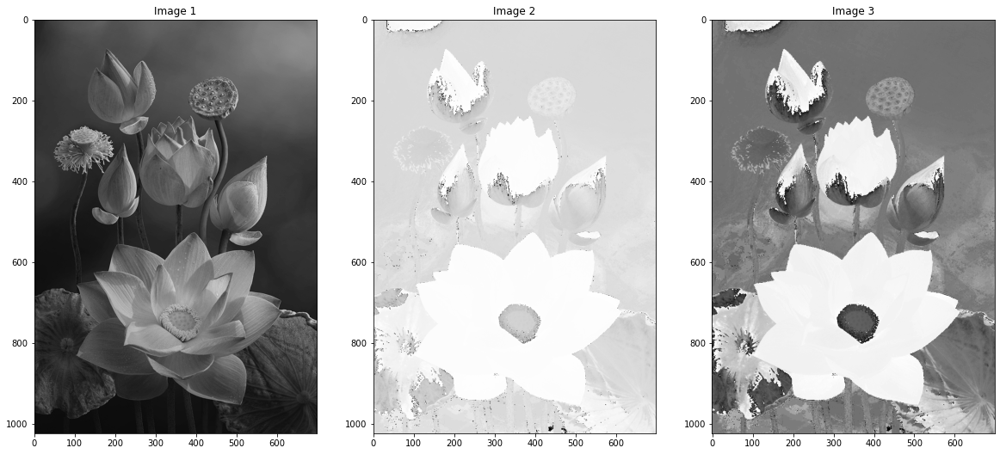

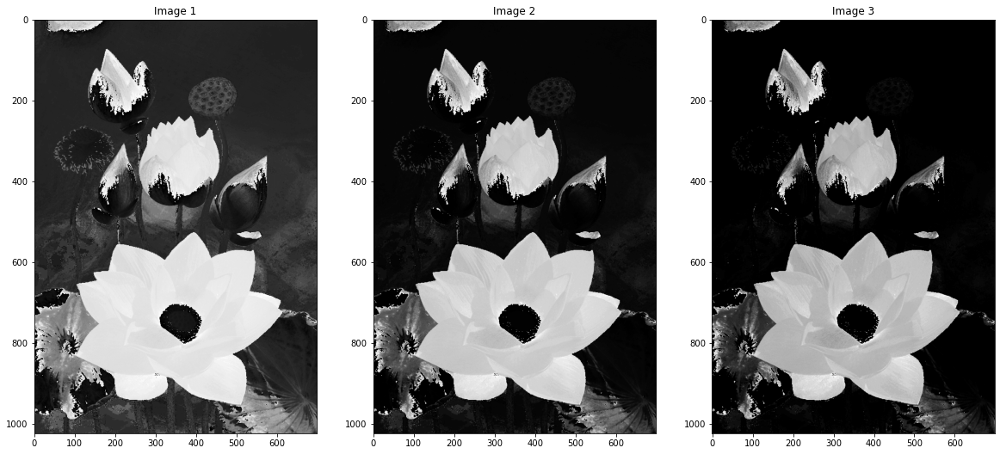

In [32]:
image2_hsv = cv2.cvtColor(image2_color, cv2.COLOR_RGB2HSV)
img = image2_hsv[:,:,0]
gamma = [0.1, 0.5, 1.2, 2.2, 3.2]
gamma_corrected_01 = np.array(255*(img / 255) ** gamma[0], dtype = 'uint8') 
gamma_corrected_02 = np.array(255*(img / 255) ** gamma[1], dtype = 'uint8') 
gamma_corrected_03 = np.array(255*(img / 255) ** gamma[2], dtype = 'uint8') 
gamma_corrected_04 = np.array(255*(img / 255) ** gamma[3], dtype = 'uint8')
gamma_corrected_05 = np.array(255*(img / 255) ** gamma[4], dtype = 'uint8')
ShowThreeImages(image2_gray, gamma_corrected_01, gamma_corrected_02)
ShowThreeImages(gamma_corrected_03, gamma_corrected_04, gamma_corrected_05)

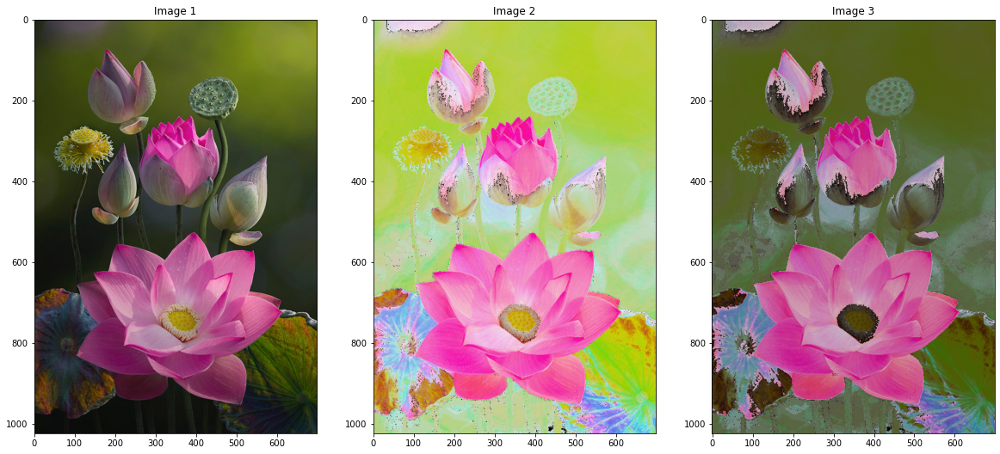

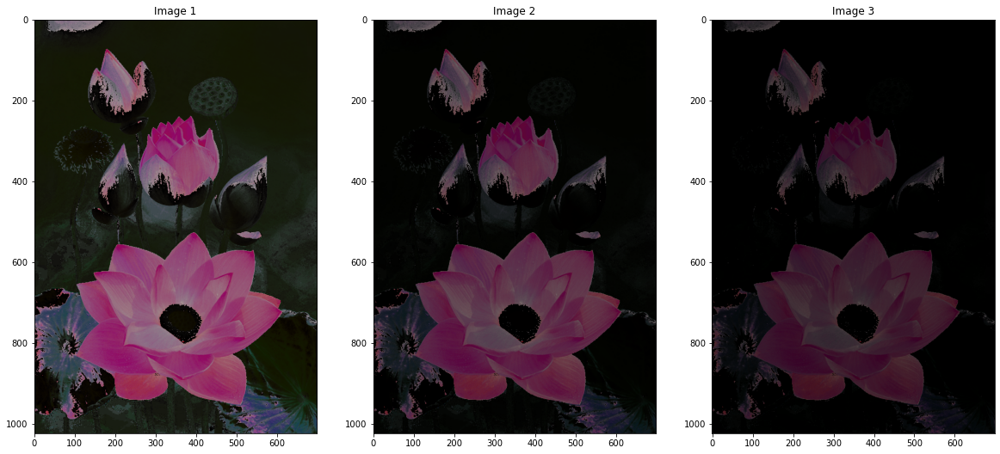

In [33]:
channel = 0
image_hsv_01 = image2_hsv.copy()
image_hsv_01[:,:,2] = gamma_corrected_01
image_enhanced_01 = cv2.cvtColor(image_hsv_01, cv2.COLOR_HSV2RGB)
image_hsv_02 = image2_hsv.copy()
image_hsv_02[:,:,2] = gamma_corrected_02
image_enhanced_02 = cv2.cvtColor(image_hsv_02, cv2.COLOR_HSV2RGB)
image_hsv_03 = image2_hsv.copy()
image_hsv_03[:,:,2] = gamma_corrected_03
image_enhanced_03 = cv2.cvtColor(image_hsv_03, cv2.COLOR_HSV2RGB)
image_hsv_04 = image2_hsv.copy()
image_hsv_04[:,:,2] = gamma_corrected_04
image_enhanced_04 = cv2.cvtColor(image_hsv_04, cv2.COLOR_HSV2RGB)
image_hsv_05 = image2_hsv.copy()
image_hsv_05[:,:,2] = gamma_corrected_05
image_enhanced_05 = cv2.cvtColor(image_hsv_05, cv2.COLOR_HSV2RGB)

ShowThreeImages(image2_color, image_enhanced_01, image_enhanced_02)
ShowThreeImages(image_enhanced_03, image_enhanced_04, image_enhanced_05)

______________________________

Biến đổi gamma trên kênh S

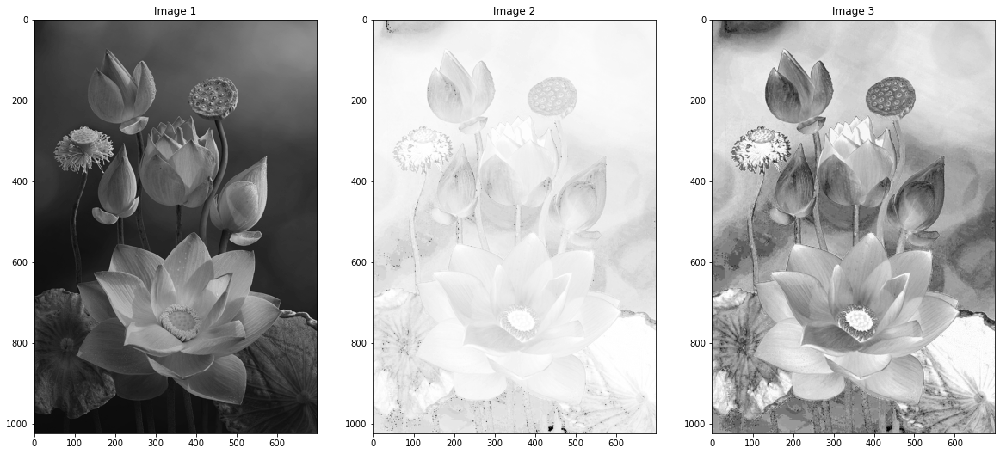

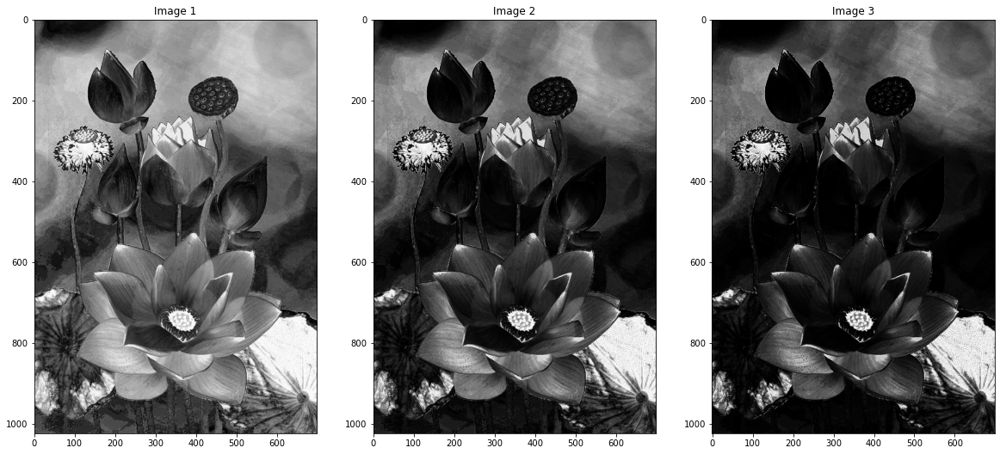

In [34]:
image2_hsv = cv2.cvtColor(image2_color, cv2.COLOR_RGB2HSV)
img = image2_hsv[:,:,1]
gamma = [0.1, 0.5, 1.2, 2.2, 3.2]
gamma_corrected_01 = np.array(255*(img / 255) ** gamma[0], dtype = 'uint8') 
gamma_corrected_02 = np.array(255*(img / 255) ** gamma[1], dtype = 'uint8') 
gamma_corrected_03 = np.array(255*(img / 255) ** gamma[2], dtype = 'uint8') 
gamma_corrected_04 = np.array(255*(img / 255) ** gamma[3], dtype = 'uint8')
gamma_corrected_05 = np.array(255*(img / 255) ** gamma[4], dtype = 'uint8')
ShowThreeImages(image2_gray, gamma_corrected_01, gamma_corrected_02)
ShowThreeImages(gamma_corrected_03, gamma_corrected_04, gamma_corrected_05)

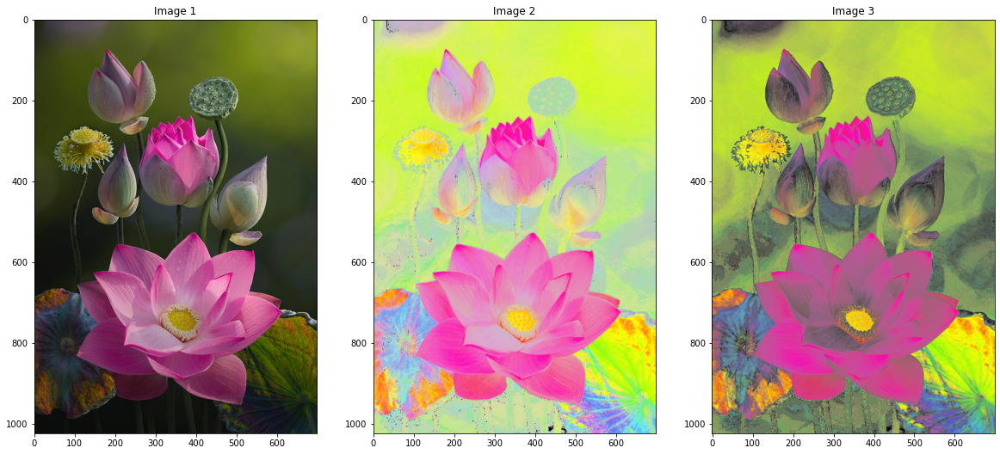

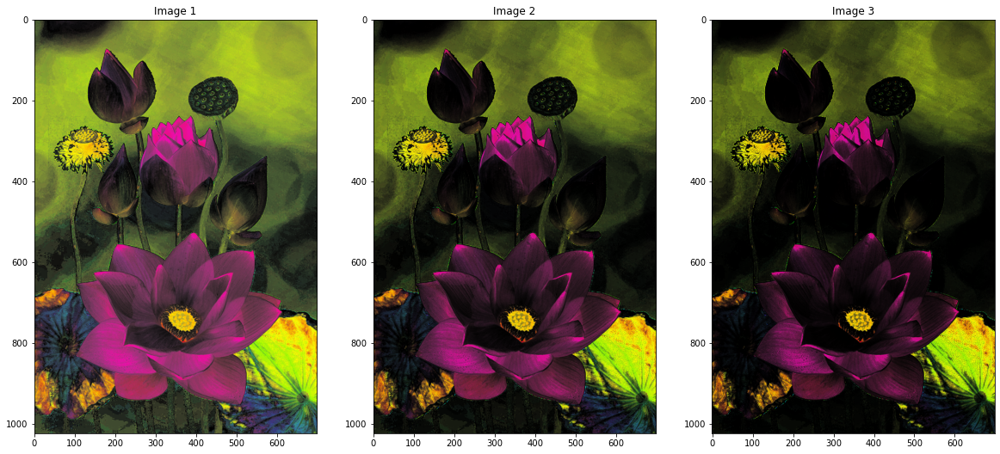

In [35]:
channel = 1
image_hsv_01 = image2_hsv.copy()
image_hsv_01[:,:,2] = gamma_corrected_01
image_enhanced_01 = cv2.cvtColor(image_hsv_01, cv2.COLOR_HSV2RGB)
image_hsv_02 = image2_hsv.copy()
image_hsv_02[:,:,2] = gamma_corrected_02
image_enhanced_02 = cv2.cvtColor(image_hsv_02, cv2.COLOR_HSV2RGB)
image_hsv_03 = image2_hsv.copy()
image_hsv_03[:,:,2] = gamma_corrected_03
image_enhanced_03 = cv2.cvtColor(image_hsv_03, cv2.COLOR_HSV2RGB)
image_hsv_04 = image2_hsv.copy()
image_hsv_04[:,:,2] = gamma_corrected_04
image_enhanced_04 = cv2.cvtColor(image_hsv_04, cv2.COLOR_HSV2RGB)
image_hsv_05 = image2_hsv.copy()
image_hsv_05[:,:,2] = gamma_corrected_05
image_enhanced_05 = cv2.cvtColor(image_hsv_05, cv2.COLOR_HSV2RGB)

ShowThreeImages(image2_color, image_enhanced_01, image_enhanced_02)
ShowThreeImages(image_enhanced_03, image_enhanced_04, image_enhanced_05)

______________________________________________________________________________________________________________________
Biến đổi gamma trên kênh V

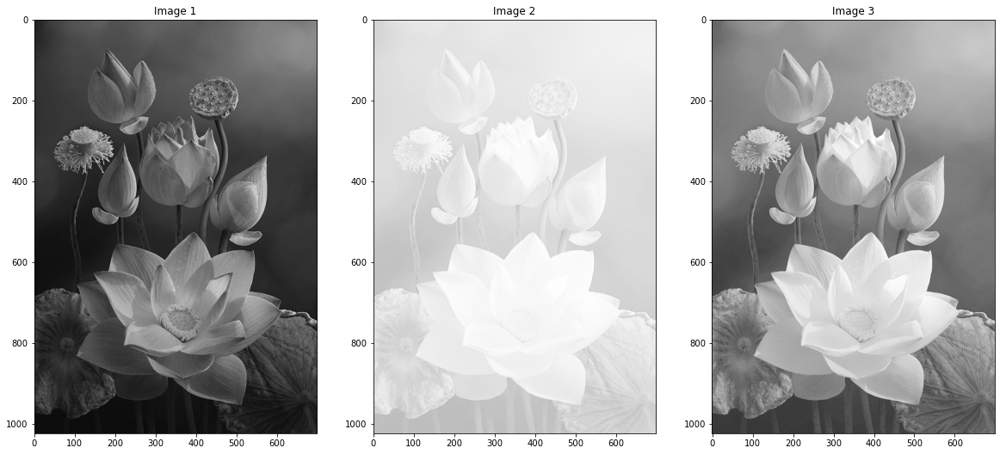

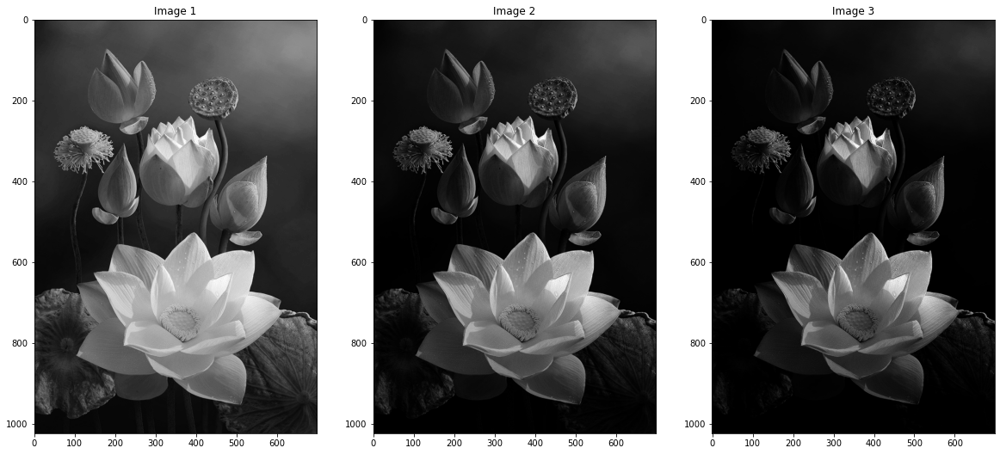

In [36]:
image2_hsv = cv2.cvtColor(image2_color, cv2.COLOR_RGB2HSV)
img = image2_hsv[:,:,2]
gamma = [0.1, 0.5, 1.2, 2.2, 3.2]
gamma_corrected_01 = np.array(255*(img / 255) ** gamma[0], dtype = 'uint8') 
gamma_corrected_02 = np.array(255*(img / 255) ** gamma[1], dtype = 'uint8') 
gamma_corrected_03 = np.array(255*(img / 255) ** gamma[2], dtype = 'uint8') 
gamma_corrected_04 = np.array(255*(img / 255) ** gamma[3], dtype = 'uint8')
gamma_corrected_05 = np.array(255*(img / 255) ** gamma[4], dtype = 'uint8')
ShowThreeImages(image2_gray, gamma_corrected_01, gamma_corrected_02)
ShowThreeImages(gamma_corrected_03, gamma_corrected_04, gamma_corrected_05)

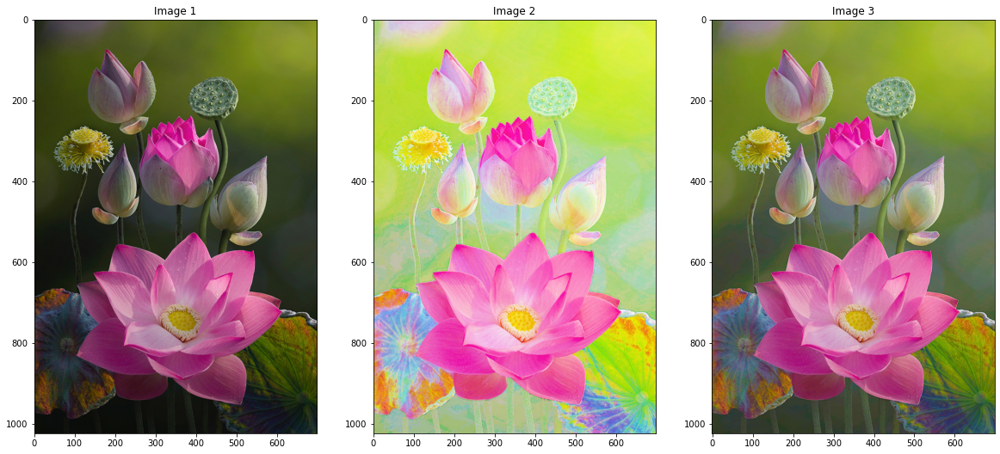

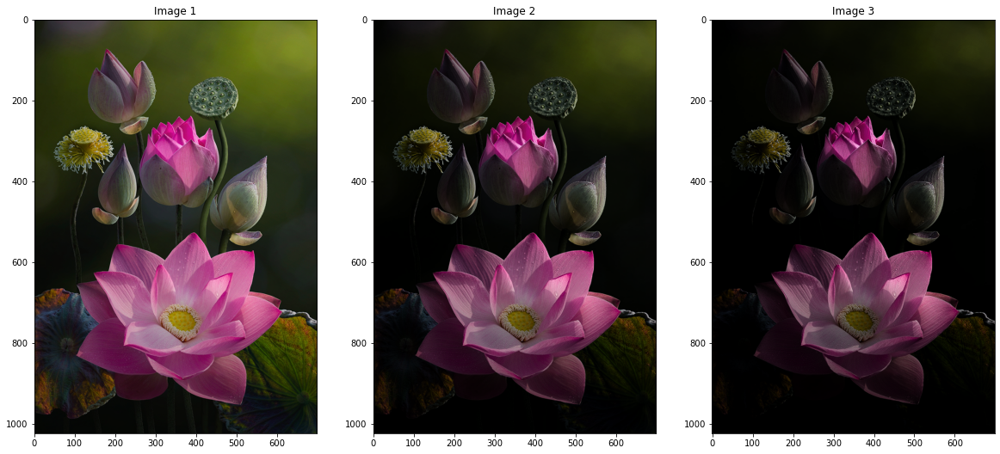

In [37]:
channel = 2
image_hsv_01 = image2_hsv.copy()
image_hsv_01[:,:,2] = gamma_corrected_01
image_enhanced_01 = cv2.cvtColor(image_hsv_01, cv2.COLOR_HSV2RGB)
image_hsv_02 = image2_hsv.copy()
image_hsv_02[:,:,2] = gamma_corrected_02
image_enhanced_02 = cv2.cvtColor(image_hsv_02, cv2.COLOR_HSV2RGB)
image_hsv_03 = image2_hsv.copy()
image_hsv_03[:,:,2] = gamma_corrected_03
image_enhanced_03 = cv2.cvtColor(image_hsv_03, cv2.COLOR_HSV2RGB)
image_hsv_04 = image2_hsv.copy()
image_hsv_04[:,:,2] = gamma_corrected_04
image_enhanced_04 = cv2.cvtColor(image_hsv_04, cv2.COLOR_HSV2RGB)
image_hsv_05 = image2_hsv.copy()
image_hsv_05[:,:,2] = gamma_corrected_05
image_enhanced_05 = cv2.cvtColor(image_hsv_05, cv2.COLOR_HSV2RGB)

ShowThreeImages(image2_color, image_enhanced_01, image_enhanced_02)
ShowThreeImages(image_enhanced_03, image_enhanced_04, image_enhanced_05)


## Chọn ngưỡng mức tối và ngưỡng mức sáng mà ở đó dưới mức tối sẽ cho tối hơn và trên mức sáng sẽ cho sáng hơn trên kênh màu value trong hsv. Sau đó hiển thị ảnh kết quả sau khi enhance 

In [38]:
# With (r1, s1), (r2, s2) as parameters, the function stretches the intensity levels 
# by essentially decreasing the intensity of the dark pixels and increasing the intensity 
# of the light pixels. If r1 = s1 = 0 and r2 = s2 = L-1, the function becomes a straight 
# dotted line in the graph (which gives no effect). 
# The function is monotonically increasing so that the order of intensity levels between pixels 
# is preserved.
# Function to map each intensity level to output intensity level. 
def pixelValTransformation(pix, r1, s1, r2, s2): 
    if (0 <= pix and pix <= r1): 
        return (s1 / r1)*pix 
    elif (r1 < pix and pix <= r2): 
        return ((s2 - s1)/(r2 - r1)) * (pix - r1) + s1 
    else: 
        return ((255 - s2)/(255 - r2)) * (pix - r2) + s2 

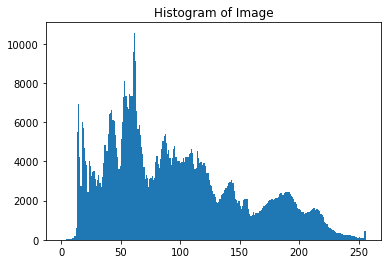

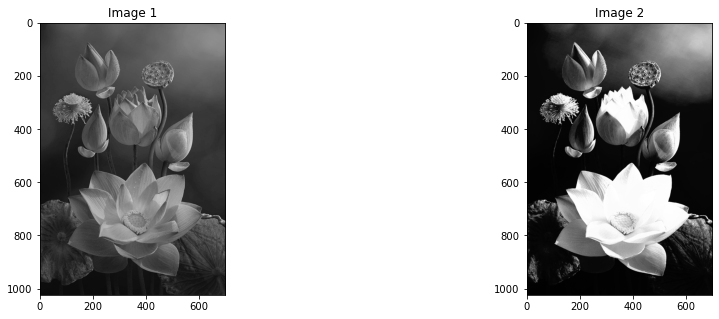

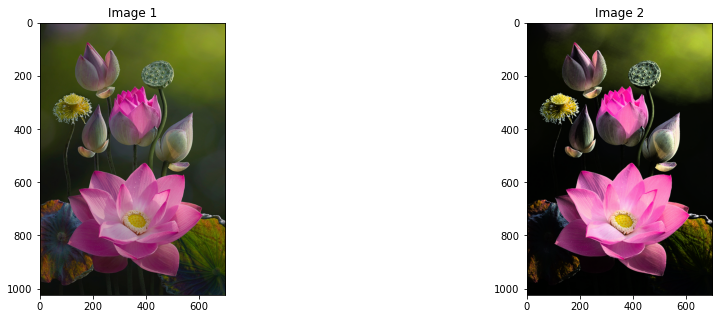

In [39]:
image2_hsv = cv2.cvtColor(image2_color, cv2.COLOR_RGB2HSV)
image_hsv_value = image2_hsv[:,:,2]

hist = cv2.calcHist([image_hsv_value],[0],None,[256],[0,256])
plt.hist(image_hsv_value.ravel(),256,[0,256])
plt.title('Histogram of Image')
plt.show()

# Define parameters. 
r1 =70
s1 = 10
r2 = 180
s2 = 250

# Vectorize the function to apply it to each value in the Numpy array. 
pixelVal_vec = np.vectorize(pixelValTransformation) 
# Apply contrast stretching. 
contrast_stretched = pixelVal_vec(image_hsv_value, r1, s1, r2, s2) 

image2_hsv[:,:,2] = contrast_stretched
image_enhanced = cv2.cvtColor(image2_hsv, cv2.COLOR_HSV2RGB)

ShowTwoImages(image2_gray, contrast_stretched)
ShowTwoImages(image2_color, image_enhanced)

## Xuất ảnh biên/cạnh của ảnh gốc

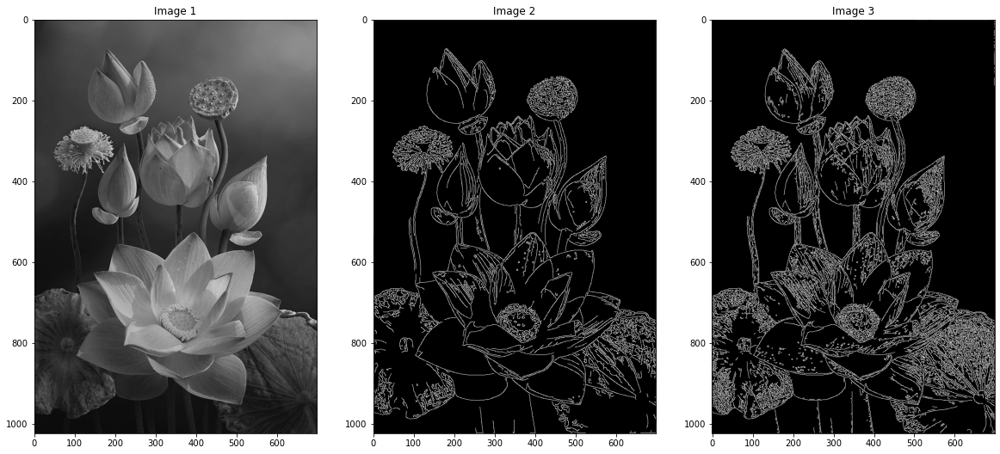

In [40]:
from skimage import feature
# sigma help to remove the noisy image in edge detection
image_edges_01 = feature.canny(image2_gray)
image_edges_02 = feature.canny(image2_gray, sigma=0.5)
ShowThreeImages(image2_gray, image_edges_01, image_edges_02)

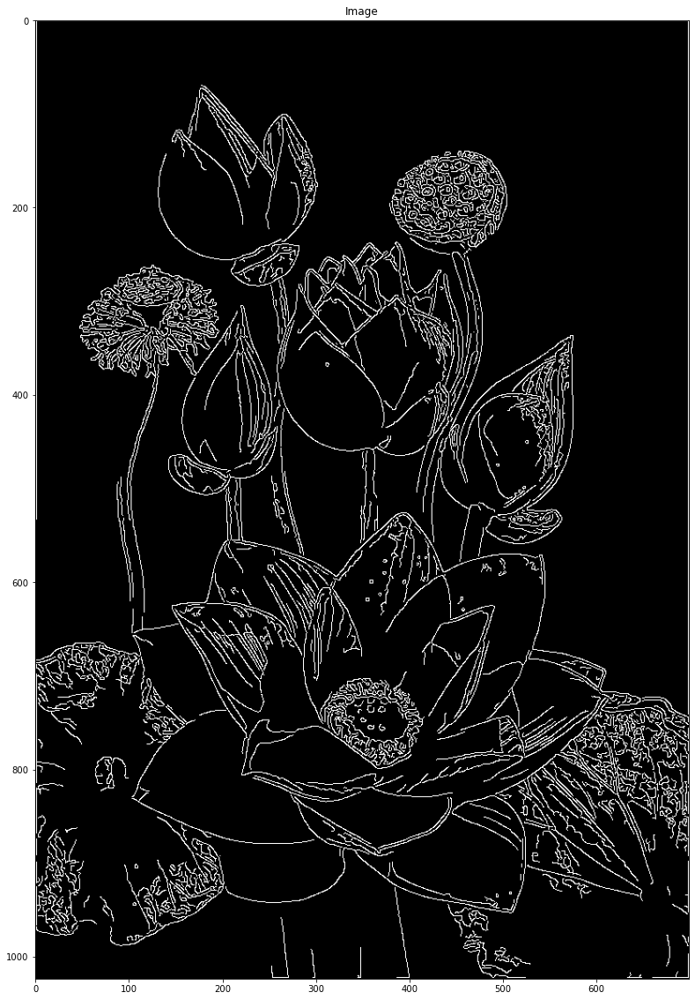

In [41]:
ShowOneImage(image_edges_01)

## Dùng K-Means để Segment ảnh

C:\Users\quang\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


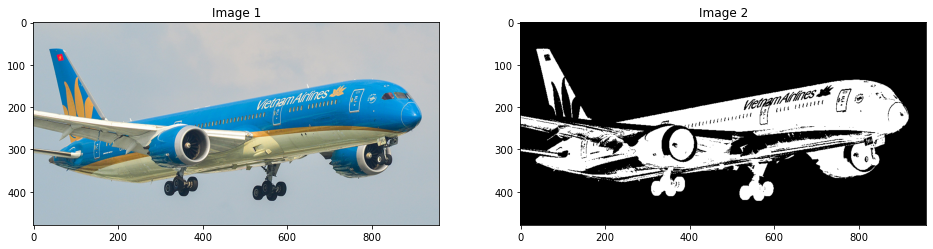

In [91]:
from sklearn.cluster import KMeans

# Đọc ảnh
image = imread('VNAirline.jpg')


# Reshape ảnh thành một mảng 2D
pixels = image.reshape(-1, 3)

# Sử dụng K-Means để phân đoạn màu
k = 2  # Số lượng cụm 
kmeans = KMeans(n_clusters=k)
kmeans.fit(pixels)

# Lấy label của từng điểm ảnh
labels = kmeans.labels_

# Tạo một ảnh kết quả với các cụm màu được gán
segmented_image = np.reshape(labels, (image.shape[0], image.shape[1]))

ShowTwoImages(image,segmented_image)
